In [1]:
import shutil
import os

In [2]:
!python --version

Python 3.8.20


In [3]:
import os
import cv2
import time
import random
import numpy as np
import random
from glob import glob

import tensorflow as tf
from tensorflow.keras.applications.inception_v3 import preprocess_input

import seaborn as sns
import matplotlib.pyplot as plt
tf.__version__, np.__version__

('2.13.0', '1.24.3')

In [4]:
src_path = "facenet512_weights.h5"
DATASET_DIR = "dataset/splitted_data_dengan_publik"

In [5]:
# Setting random seeds to enable consistency while testing.
random.seed(5)
np.random.seed(5)
tf.random.set_seed(5)

In [6]:
import cv2
from facenet_pytorch import MTCNN
import torch

device = 'cpu'
detector = MTCNN(device=device)

def crop_face(img_path, output_size=(160, 160)):
    img = cv2.imread(img_path)
    
    # Detect faces in the image
    boxes, _ = detector.detect(img)
    if boxes is not None:
        for box in boxes:
            try:
                bbox = list(map(int,box.tolist()))
                x = bbox[0]
                y = bbox[1]
                w = bbox[2] - bbox[0]
                h = bbox[3] - bbox[1]

                expand_percentage = 10
                if expand_percentage > 0:
                    # Expand the facial region height and width by the provided percentage
                    # ensuring that the expanded region stays within img.shape limits
                    expanded_w = w + int(w * expand_percentage / 100)
                    expanded_h = h + int(h * expand_percentage / 100)

                    x = max(0, x - int((expanded_w - w) / 2))
                    y = max(0, y - int((expanded_h - h) / 2))
                    w = min(img.shape[1] - x, expanded_w)
                    h = min(img.shape[0] - y, expanded_h)

                # extract detected face unaligned
                cropped_face = img[y: int(y + h), x: int(x + w), :]
                face_with_color = cv2.cvtColor(cropped_face, cv2.COLOR_BGR2RGB)
                return deepface_crop_image(face_with_color, output_size)
            except:
                continue
    
    # Instead of fallback to crop_center, return None to indicate no face was detected
    return None
    
def deepface_crop_image(current_img, target_size=(160, 160)):
    factor_0 = target_size[0] / current_img.shape[0]
    factor_1 = target_size[1] / current_img.shape[1]
    factor = min(factor_0, factor_1)

    dsize = (
        int(current_img.shape[1] * factor),
        int(current_img.shape[0] * factor),
    )
    current_img = cv2.resize(current_img, dsize)

    diff_0 = target_size[0] - current_img.shape[0]
    diff_1 = target_size[1] - current_img.shape[1]
    # Put the base image in the middle of the padded image
    current_img = np.pad(
        current_img,
        (
            (diff_0 // 2, diff_0 - diff_0 // 2),
            (diff_1 // 2, diff_1 - diff_1 // 2),
            (0, 0),
        ),
        "constant",
    )

    # double check: if target image is not still the same size with target.
    if current_img.shape[0:2] != target_size:
        current_img = cv2.resize(current_img, target_size)
    return current_img

def crop_center(img, output_size=(160, 160)):
    # Read the image

    if img is None:
        print("Error: Unable to load image.")
        return None

    # Get the dimensions of the image
    h, w, _ = img.shape

    # Calculate the center of the original image
    center = (w // 2, h // 2)

    # Calculate the top-left corner of the cropped area
    x = center[0] - output_size[0] // 2
    y = center[1] - output_size[1] // 2

    # Ensure the cropped area is fully within the original image dimensions
    x = max(0, x)
    y = max(0, y)

    # Ensure cropped area does not go out of bounds
    x_end = min(w, x + output_size[0])
    y_end = min(h, y + output_size[1])

    # Crop the image
    cropped_img = img[y:y_end, x:x_end, :]

    return cv2.cvtColor(cropped_img, cv2.COLOR_BGR2RGB)

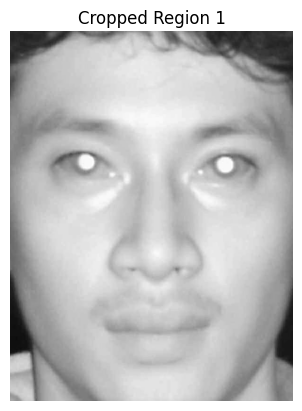

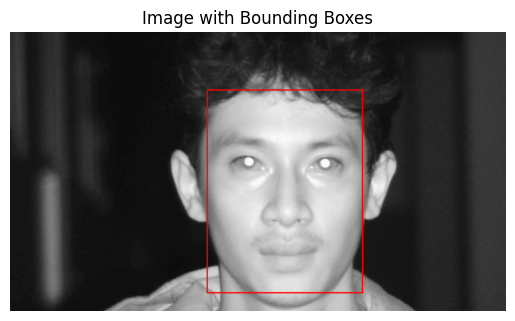

In [7]:
sample_img_path = os.path.join(DATASET_DIR, 'Wahyu', 'Wahyu_1M_mp4-0001_jpg.rf.f247356ff7fb0ea5d8041cb76643cac0.jpg')

# Read the image
img = cv2.imread(sample_img_path)

# Detect faces or objects
boxes, _ = detector.detect(img)

# Convert BGR to RGB for display
img_rgb = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB)

# Plot with bounding boxes
if boxes is not None:
    for i, box in enumerate(boxes):
        try:
            bbox = list(map(int, box.tolist()))
            x1, y1, x2, y2 = bbox
            # Draw red, bold rectangle
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 0, 255), 3)

            # Crop the bounding box area
            crop = img_rgb[y1:y2, x1:x2]

            # Plot the cropped region
            plt.figure()
            plt.imshow(crop)
            plt.title(f'Cropped Region {i+1}')
            plt.axis('off')

        except:
            continue

# Show the original image with bounding boxes
img_with_boxes = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(img_with_boxes)
plt.title('Image with Bounding Boxes')
plt.axis('off')

plt.show()


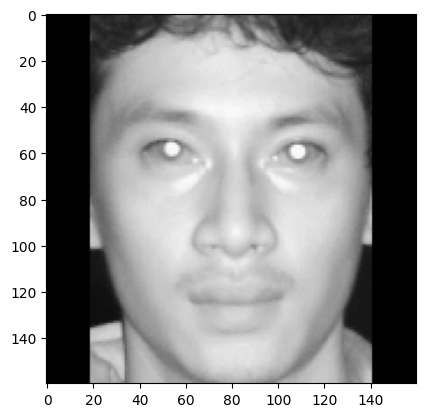

In [8]:
cache_img = {}
cache_img_status = {}  # To track which images have valid faces

def read_image(index):
    path = os.path.join(DATASET_DIR, index[0], index[1])
    
    # Check if we already know this image has no face
    if path in cache_img_status and cache_img_status[path] is False:
        return None
    
    # Check if image is already in cache
    if path not in cache_img:
        image = crop_face(path, (160, 160))
        if image is None:
            # No face detected, mark it in the status cache
            cache_img_status[path] = False
            return None
        
        # Face detected, cache the image
        cache_img[path] = image
        cache_img_status[path] = True
    
    return cache_img[path]

img = read_image(('Wahyu', 'Wahyu_1M_mp4-0001_jpg.rf.f247356ff7fb0ea5d8041cb76643cac0.jpg'))
plt.imshow(img)

In [9]:
def validate_dataset(directory, max_files_per_folder=None):
    """
    Analyzes the dataset directory to find valid face images and provides statistics.
    
    Args:
        directory: Path to the dataset directory
        max_files_per_folder: Maximum number of files to check per folder (None = check all)
    
    Returns:
        Dictionary with validation statistics
    """
    folders = next(os.walk(directory))[1]
    
    stats = {
        'total_folders': len(folders),
        'total_images': 0,
        'valid_images': 0,
        'invalid_images': 0,
        'folders_with_valid_faces': 0,
        'folders_with_multiple_faces': 0,
        'per_folder': {}
    }
    
    print(f"Validating dataset in {directory}...")
    print(f"Found {len(folders)} folders")
    
    for folder in folders:
        folder_path = os.path.join(directory, folder)
        files = os.listdir(folder_path)
        
        if max_files_per_folder is not None:
            files = files[:max_files_per_folder]
        
        stats['total_images'] += len(files)
        
        folder_stats = {
            'total': len(files),
            'valid': 0,
            'invalid': 0
        }
        
        for file in files:
            file_path = os.path.join(folder_path, file)
            
            # Check if already in cache
            if file_path in cache_img_status:
                has_face = cache_img_status[file_path]
            else:
                # Process image to detect face
                image = crop_face(file_path)
                has_face = image is not None
                cache_img_status[file_path] = has_face
                if has_face:
                    cache_img[file_path] = image
            
            if has_face:
                folder_stats['valid'] += 1
                stats['valid_images'] += 1
            else:
                folder_stats['invalid'] += 1
                stats['invalid_images'] += 1
        
        stats['per_folder'][folder] = folder_stats
        
        if folder_stats['valid'] > 0:
            stats['folders_with_valid_faces'] += 1
            
        if folder_stats['valid'] >= 2:
            stats['folders_with_multiple_faces'] += 1
    
    stats['valid_percentage'] = (stats['valid_images'] / stats['total_images']) * 100 if stats['total_images'] > 0 else 0
    
    print("\n=== Dataset Validation Summary ===")
    print(f"Total folders: {stats['total_folders']}")
    print(f"Total images: {stats['total_images']}")
    print(f"Images with valid faces: {stats['valid_images']} ({stats['valid_percentage']:.2f}%)")
    print(f"Images without valid faces: {stats['invalid_images']}")
    print(f"Folders with at least one valid face: {stats['folders_with_valid_faces']}")
    print(f"Folders with multiple valid faces (usable for training): {stats['folders_with_multiple_faces']}")
    
    # Print folders with less than 2 valid faces (problematic for training)
    problem_folders = [folder for folder, data in stats['per_folder'].items() if data['valid'] < 2]
    if problem_folders:
        print("\nWarning: The following folders have less than 2 valid face images (problem for triplet creation):")
        for folder in problem_folders:
            data = stats['per_folder'][folder]
            print(f"  - {folder}: {data['valid']}/{data['total']} valid images")
    
    # Check if we have enough valid data for training
    min_folders_needed = 2  # Need at least 2 different identities
    if stats['folders_with_multiple_faces'] < min_folders_needed:
        print(f"\nCRITICAL WARNING: Not enough folders with multiple valid faces!")
        print(f"  Found {stats['folders_with_multiple_faces']}, but need at least {min_folders_needed} for triplet training.")
    
    return stats

In [10]:
# dataset_stats = validate_dataset(DATASET_DIR)

In [11]:
def split_dataset(directory, split=0.9):
    folders = next(os.walk(directory))[1]
    num_train = int(len(folders)*split)
    
    random.shuffle(folders)
    
    train_list, test_list = {}, {}
    
    # Creating Train-list
    for index, folder in enumerate(folders):
        num_files = len(os.listdir(os.path.join(directory, folder)))
        if index < split * len(folders):
            train_list[folder] = num_files
        else:
            test_list[folder] = num_files
            
    return train_list, test_list

train_list, test_list = split_dataset(DATASET_DIR, split=0.7)
print("Length of training list:", len(train_list))
for label in train_list:
    print(label)
print("Length of testing list :", len(test_list))
for label in test_list:
    print(label)

Length of training list: 35
class_10
class_17
class_08
class_36
class_27
class_25
class_41
Nurhatinah
Syahid
class_37
class_20
Mahdaniar
Wahyu
class_30
class_26
class_34
class_16
class_19
class_13
class_18
class_03
class_01
class_24
class_11
Erwin
class_04
class_07
class_12
class_31
class_35
Amri
class_33
class_05
class_23
class_39
Length of testing list : 15
class_29
class_22
class_06
class_09
class_02
class_14
class_28
Bulan
class_32
class_40
Iska
class_21
Raiz
class_15
class_38


In [12]:
folders = next(os.walk(DATASET_DIR))[1]
num_folders = len(folders)

num_off_classes = int(num_folders * 0.3)
num_main_classes = num_folders - num_off_classes

In [13]:
# num_main_classes

In [14]:
def split_dataset_with_off_class(directory, main_class_split=0.7, off_class_ratio=0.3):
    """
    Split dataset into training and testing sets, while marking certain folders as off-class data
    
    Args:
        directory: Root directory of the dataset
        main_class_split: Split ratio for main classes (train/test)
        off_class_ratio: Ratio of classes to be used as off-class (not for prediction)
    
    Returns:
        train_main_list: Main classes for training (will be used for prediction)
        test_main_list: Main classes for testing (will be used for prediction)
        off_class_list: Off-classes (only used to enhance training)
    """
    # Get all class folders
    folders = next(os.walk(directory))[1]
    num_folders = len(folders)
    
    # Shuffle the folders for random assignment
    random.shuffle(folders)
    
    # Determine how many classes will be off-classes
    num_off_classes = int(num_folders * off_class_ratio)
    num_main_classes = num_folders - num_off_classes
    
    # Split main classes into train and test
    num_train_main = int(num_main_classes * main_class_split)
    
    train_main_list, test_main_list, off_class_list = {}, {}, {}
    
    # Assign classes to their respective lists with sample counts
    for i, folder in enumerate(folders):
        num_files = len(os.listdir(os.path.join(directory, folder)))
        
        if i < num_train_main:
            train_main_list[folder] = num_files
        elif i < num_main_classes:
            test_main_list[folder] = num_files
        else:
            off_class_list[folder] = num_files
    
    return train_main_list, test_main_list, off_class_list

In [15]:
def create_triplets(directory, folder_list, max_files=20):
    triplets = []
    folders = list(folder_list.keys())
    
    # First, let's identify all valid images (containing faces)
    valid_images = {}
    for folder in folders:
        valid_images[folder] = []
        path = os.path.join(directory, folder)
        files = list(os.listdir(path))[:max_files]
        
        for file in files:
            img_path = os.path.join(path, file)
            if img_path not in cache_img_status:
                # Check if face can be detected
                image = crop_face(img_path, (160, 160))
                cache_img_status[img_path] = image is not None
                if image is not None:
                    cache_img[img_path] = image
            
            if cache_img_status.get(img_path, False):
                valid_images[folder].append(file)
    
    # Now create triplets using only valid images
    for folder in folders:
        valid_files = valid_images[folder]
        num_files = len(valid_files)
        
        if num_files < 2:  # Need at least 2 images of the same person
            continue
        
        for i in range(num_files-1):
            for j in range(i+1, num_files):
                anchor = (folder, valid_files[i])
                positive = (folder, valid_files[j])

                # Find a valid negative image
                valid_neg_folders = [f for f in folders if f != folder and valid_images[f]]
                if not valid_neg_folders:
                    continue
                    
                neg_folder = random.choice(valid_neg_folders)
                neg_files = valid_images[neg_folder]
                negative = (neg_folder, random.choice(neg_files))

                triplets.append((anchor, positive, negative))
            
    random.shuffle(triplets)
    return triplets

In [16]:
def create_triplets_with_off_class(directory, main_folder_list, off_class_folder_list, max_files=30):
    """
    Create triplets including off-class data for training, but these off-classes 
    won't be in the final prediction set
    """
    triplets = []
    main_folders = list(main_folder_list.keys())
    all_folders = main_folders + list(off_class_folder_list.keys())
    
    # Create triplets where anchor and positive are from same class
    for folder in all_folders:
        path = os.path.join(directory, folder)
        files = list(os.listdir(path))[:max_files]
        num_files = len(files)
        
        for i in range(num_files-1):
            for j in range(i+1, num_files):
                anchor = (folder, files[i])
                positive = (folder, files[j])
                
                # Choose negative from any folder other than anchor's folder
                neg_folder = folder
                while neg_folder == folder:
                    neg_folder = random.choice(all_folders)
                neg_files = list(os.listdir(os.path.join(directory, neg_folder)))[:max_files]
                negative = (neg_folder, random.choice(neg_files))
                
                triplets.append((anchor, positive, negative))
    
    random.shuffle(triplets)
    return triplets

In [17]:
def create_test_triplets(directory, test_folder_list, max_files=30):
    """
    Create triplets for testing using only the main class folders
    """
    triplets = []
    test_folders = list(test_folder_list.keys())
    
    for folder in test_folders:
        path = os.path.join(directory, folder)
        files = list(os.listdir(path))[:max_files]
        num_files = len(files)
        
        for i in range(num_files-1):
            for j in range(i+1, num_files):
                anchor = (folder, files[i])
                positive = (folder, files[j])
                
                neg_folder = folder
                while neg_folder == folder:
                    neg_folder = random.choice(test_folders)
                neg_files = list(os.listdir(os.path.join(directory, neg_folder)))[:max_files]
                negative = (neg_folder, random.choice(neg_files))
                
                triplets.append((anchor, positive, negative))
    
    random.shuffle(triplets)
    return triplets

In [18]:
train_main, test_main, off_class = split_dataset_with_off_class(DATASET_DIR, main_class_split=0.7, off_class_ratio=0.3)
train_triplet = create_triplets_with_off_class(DATASET_DIR, train_main, off_class)
test_triplet = create_test_triplets(DATASET_DIR, test_main)


In [19]:
# train_triplet = create_triplets(DATASET_DIR, train_list)
# test_triplet  = create_triplets(DATASET_DIR, test_list)

print("Number of training triplets:", len(train_triplet))
print("Number of testing triplets :", len(test_triplet))

# # Add this code after the line where test_list is created
# with open('test_list_contents.txt', 'w') as f:
#     for triplet in test_triplet:
#         f.write(f"{triplet}\n")
    
# print("Test list contents have been written to 'test_list_contents.txt'")

# # Add this code after the line where test_list is created
# with open('train_list_contents.txt', 'w') as f:
#     for triplet in train_triplet:
#         f.write(f"{triplet}\n")
    
# print("Test list contents have been written to 'train_list_contents.txt'")

print("\nExamples of triplets:")
for i in range(3):
    print(train_triplet[i])

Number of training triplets: 5157
Number of testing triplets : 1464

Examples of triplets:
(('Raiz', 'Raiz_1M_mp4-0007_jpg.rf.459c8516508b970dad4bf1c82181d514.jpg'), ('Raiz', 'Raiz_1M_mp4-0008_jpg.rf.38c08bfcc05fddad358e02cd95466be1.jpg'), ('class_19', '19S2INA1.jpg'))
(('class_36', '36S1INA1.jpg'), ('class_36', '36S2IAR1.jpg'), ('class_26', '26S2INA1.jpg'))
(('Raiz', 'Raiz_1M_mp4-0006_jpg.rf.8c99ef562993447b1c3a92da322298ca.jpg'), ('Raiz', 'Raiz_1M_mp4-0015_jpg.rf.cbb546b3b26f702365ba44609fbe831b.jpg'), ('class_03', '03S2IAR1.jpg'))


In [20]:
import random

def get_batch(triplet_list, batch_size=256, preprocess=True):
    triplet_pool = triplet_list.copy()
    random.shuffle(triplet_pool)
    
    i = 0
    while i < len(triplet_pool):
        anchor, positive, negative = [], [], []
        skipped = 0

        while len(anchor) < batch_size and i < len(triplet_pool):
            a, p, n = triplet_pool[i]
            i += 1

            a_img = read_image(a)
            p_img = read_image(p)
            n_img = read_image(n)

            if a_img is None or p_img is None or n_img is None:
                skipped += 1
                continue

            # Validate triplet: ensure a and p are from same folder, n is from different folder
            if a[0] != p[0] or a[0] == n[0]:
                print(f"Invalid triplet: Anchor={a}, Positive={p}, Negative={n}")
                skipped += 1
                continue

            anchor.append(a_img)
            positive.append(p_img)
            negative.append(n_img)

        if len(anchor) == 0:
            print(f"Skipped {skipped} triplets in batch")
            continue

        anchor = np.array(anchor)
        positive = np.array(positive)
        negative = np.array(negative)

        if preprocess:
            anchor = preprocess_input(anchor)
            positive = preprocess_input(positive)
            negative = preprocess_input(negative)

        print(f"Yielding batch with {len(anchor)} triplets, skipped {skipped}")
        yield [anchor, positive, negative]


Yielding batch with 5 triplets, skipped 0


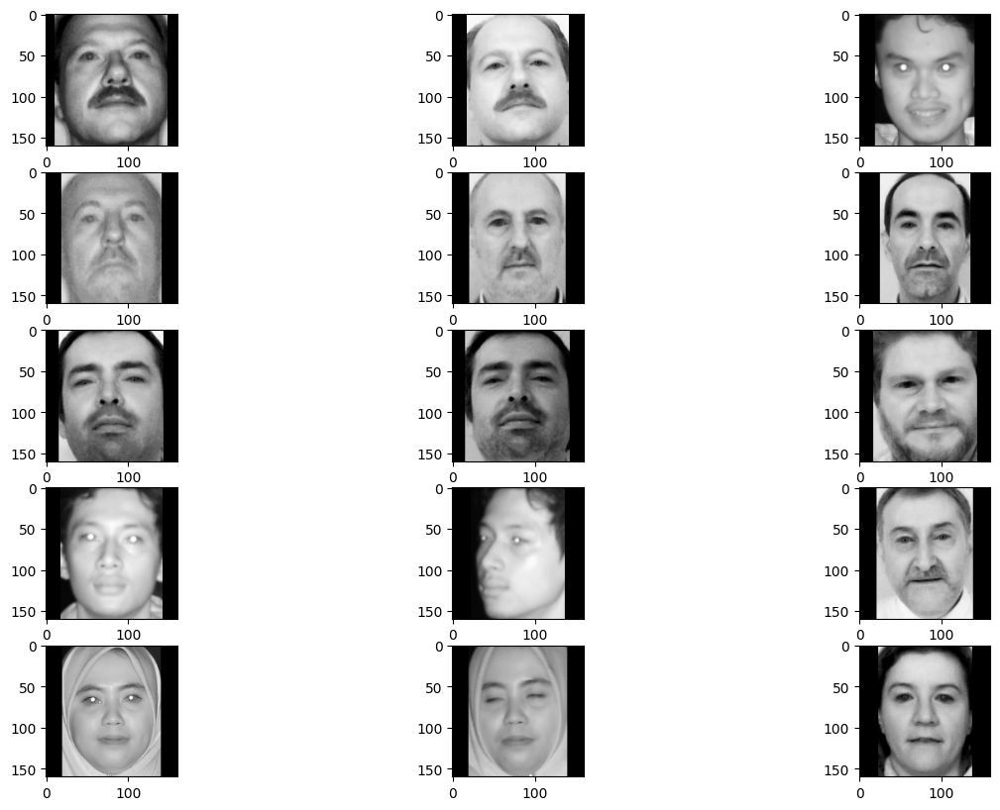

In [21]:
num_plots = 5

a, p, n = next(get_batch(train_triplet, batch_size=num_plots, preprocess=False))
actual_batch_size = len(a)
f, axes = plt.subplots(actual_batch_size, 3, figsize=(15, 2 * actual_batch_size))

for i in range(actual_batch_size):
    axes[i, 0].imshow(a[i])
    axes[i, 1].imshow(p[i])
    axes[i, 2].imshow(n[i])


In [22]:
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Concatenate
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Lambda
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import add
from tensorflow.keras import backend as K

def InceptionResNetV2(dimension: int = 128) -> Model:
    """
    InceptionResNetV2 model
    Args:
        dimension (int): number of dimensions in the embedding layer
    Returns:
        model (Model)
    """

    inputs = Input(shape=(160, 160, 3))
    x = Conv2D(32, 3, strides=2, padding="valid", use_bias=False, name="Conv2d_1a_3x3")(inputs)
    x = BatchNormalization(
        axis=3, momentum=0.995, epsilon=0.001, scale=False, name="Conv2d_1a_3x3_BatchNorm"
    )(x)
    x = Activation("relu", name="Conv2d_1a_3x3_Activation")(x)
    x = Conv2D(32, 3, strides=1, padding="valid", use_bias=False, name="Conv2d_2a_3x3")(x)
    x = BatchNormalization(
        axis=3, momentum=0.995, epsilon=0.001, scale=False, name="Conv2d_2a_3x3_BatchNorm"
    )(x)
    x = Activation("relu", name="Conv2d_2a_3x3_Activation")(x)
    x = Conv2D(64, 3, strides=1, padding="same", use_bias=False, name="Conv2d_2b_3x3")(x)
    x = BatchNormalization(
        axis=3, momentum=0.995, epsilon=0.001, scale=False, name="Conv2d_2b_3x3_BatchNorm"
    )(x)
    x = Activation("relu", name="Conv2d_2b_3x3_Activation")(x)
    x = MaxPooling2D(3, strides=2, name="MaxPool_3a_3x3")(x)
    x = Conv2D(80, 1, strides=1, padding="valid", use_bias=False, name="Conv2d_3b_1x1")(x)
    x = BatchNormalization(
        axis=3, momentum=0.995, epsilon=0.001, scale=False, name="Conv2d_3b_1x1_BatchNorm"
    )(x)
    x = Activation("relu", name="Conv2d_3b_1x1_Activation")(x)
    x = Conv2D(192, 3, strides=1, padding="valid", use_bias=False, name="Conv2d_4a_3x3")(x)
    x = BatchNormalization(
        axis=3, momentum=0.995, epsilon=0.001, scale=False, name="Conv2d_4a_3x3_BatchNorm"
    )(x)
    x = Activation("relu", name="Conv2d_4a_3x3_Activation")(x)
    x = Conv2D(256, 3, strides=2, padding="valid", use_bias=False, name="Conv2d_4b_3x3")(x)
    x = BatchNormalization(
        axis=3, momentum=0.995, epsilon=0.001, scale=False, name="Conv2d_4b_3x3_BatchNorm"
    )(x)
    x = Activation("relu", name="Conv2d_4b_3x3_Activation")(x)

    # 5x Block35 (Inception-ResNet-A block):
    branch_0 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_1_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_1_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block35_1_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_1_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_1_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_1_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_1_Branch_1_Conv2d_0b_3x3"
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_1_Branch_1_Conv2d_0b_3x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_1_Branch_1_Conv2d_0b_3x3_Activation")(branch_1)
    branch_2 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_1_Branch_2_Conv2d_0a_1x1"
    )(x)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_1_Branch_2_Conv2d_0a_1x1_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_1_Branch_2_Conv2d_0a_1x1_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_1_Branch_2_Conv2d_0b_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_1_Branch_2_Conv2d_0b_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_1_Branch_2_Conv2d_0b_3x3_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_1_Branch_2_Conv2d_0c_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_1_Branch_2_Conv2d_0c_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_1_Branch_2_Conv2d_0c_3x3_Activation")(branch_2)
    branches = [branch_0, branch_1, branch_2]
    mixed = Concatenate(axis=3, name="Block35_1_Concatenate")(branches)
    up = Conv2D(256, 1, strides=1, padding="same", use_bias=True, name="Block35_1_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.17})(up)
    x = add([x, up])
    x = Activation("relu", name="Block35_1_Activation")(x)

    branch_0 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_2_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_2_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block35_2_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_2_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_2_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_2_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_2_Branch_1_Conv2d_0b_3x3"
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_2_Branch_1_Conv2d_0b_3x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_2_Branch_1_Conv2d_0b_3x3_Activation")(branch_1)
    branch_2 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_2_Branch_2_Conv2d_0a_1x1"
    )(x)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_2_Branch_2_Conv2d_0a_1x1_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_2_Branch_2_Conv2d_0a_1x1_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_2_Branch_2_Conv2d_0b_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_2_Branch_2_Conv2d_0b_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_2_Branch_2_Conv2d_0b_3x3_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_2_Branch_2_Conv2d_0c_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_2_Branch_2_Conv2d_0c_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_2_Branch_2_Conv2d_0c_3x3_Activation")(branch_2)
    branches = [branch_0, branch_1, branch_2]
    mixed = Concatenate(axis=3, name="Block35_2_Concatenate")(branches)
    up = Conv2D(256, 1, strides=1, padding="same", use_bias=True, name="Block35_2_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.17})(up)
    x = add([x, up])
    x = Activation("relu", name="Block35_2_Activation")(x)

    branch_0 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_3_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_3_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block35_3_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_3_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_3_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_3_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_3_Branch_1_Conv2d_0b_3x3"
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_3_Branch_1_Conv2d_0b_3x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_3_Branch_1_Conv2d_0b_3x3_Activation")(branch_1)
    branch_2 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_3_Branch_2_Conv2d_0a_1x1"
    )(x)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_3_Branch_2_Conv2d_0a_1x1_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_3_Branch_2_Conv2d_0a_1x1_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_3_Branch_2_Conv2d_0b_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_3_Branch_2_Conv2d_0b_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_3_Branch_2_Conv2d_0b_3x3_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_3_Branch_2_Conv2d_0c_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_3_Branch_2_Conv2d_0c_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_3_Branch_2_Conv2d_0c_3x3_Activation")(branch_2)
    branches = [branch_0, branch_1, branch_2]
    mixed = Concatenate(axis=3, name="Block35_3_Concatenate")(branches)
    up = Conv2D(256, 1, strides=1, padding="same", use_bias=True, name="Block35_3_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.17})(up)
    x = add([x, up])
    x = Activation("relu", name="Block35_3_Activation")(x)

    branch_0 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_4_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_4_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block35_4_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_4_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_4_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_4_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_4_Branch_1_Conv2d_0b_3x3"
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_4_Branch_1_Conv2d_0b_3x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_4_Branch_1_Conv2d_0b_3x3_Activation")(branch_1)
    branch_2 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_4_Branch_2_Conv2d_0a_1x1"
    )(x)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_4_Branch_2_Conv2d_0a_1x1_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_4_Branch_2_Conv2d_0a_1x1_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_4_Branch_2_Conv2d_0b_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_4_Branch_2_Conv2d_0b_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_4_Branch_2_Conv2d_0b_3x3_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_4_Branch_2_Conv2d_0c_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_4_Branch_2_Conv2d_0c_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_4_Branch_2_Conv2d_0c_3x3_Activation")(branch_2)
    branches = [branch_0, branch_1, branch_2]
    mixed = Concatenate(axis=3, name="Block35_4_Concatenate")(branches)
    up = Conv2D(256, 1, strides=1, padding="same", use_bias=True, name="Block35_4_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.17})(up)
    x = add([x, up])
    x = Activation("relu", name="Block35_4_Activation")(x)

    branch_0 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_5_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_5_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block35_5_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_5_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_5_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_5_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_5_Branch_1_Conv2d_0b_3x3"
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_5_Branch_1_Conv2d_0b_3x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block35_5_Branch_1_Conv2d_0b_3x3_Activation")(branch_1)
    branch_2 = Conv2D(
        32, 1, strides=1, padding="same", use_bias=False, name="Block35_5_Branch_2_Conv2d_0a_1x1"
    )(x)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_5_Branch_2_Conv2d_0a_1x1_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_5_Branch_2_Conv2d_0a_1x1_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_5_Branch_2_Conv2d_0b_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_5_Branch_2_Conv2d_0b_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_5_Branch_2_Conv2d_0b_3x3_Activation")(branch_2)
    branch_2 = Conv2D(
        32, 3, strides=1, padding="same", use_bias=False, name="Block35_5_Branch_2_Conv2d_0c_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block35_5_Branch_2_Conv2d_0c_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Block35_5_Branch_2_Conv2d_0c_3x3_Activation")(branch_2)
    branches = [branch_0, branch_1, branch_2]
    mixed = Concatenate(axis=3, name="Block35_5_Concatenate")(branches)
    up = Conv2D(256, 1, strides=1, padding="same", use_bias=True, name="Block35_5_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.17})(up)
    x = add([x, up])
    x = Activation("relu", name="Block35_5_Activation")(x)

    # Mixed 6a (Reduction-A block):
    branch_0 = Conv2D(
        384, 3, strides=2, padding="valid", use_bias=False, name="Mixed_6a_Branch_0_Conv2d_1a_3x3"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_6a_Branch_0_Conv2d_1a_3x3_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Mixed_6a_Branch_0_Conv2d_1a_3x3_Activation")(branch_0)
    branch_1 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Mixed_6a_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_6a_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Mixed_6a_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        192, 3, strides=1, padding="same", use_bias=False, name="Mixed_6a_Branch_1_Conv2d_0b_3x3"
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_6a_Branch_1_Conv2d_0b_3x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Mixed_6a_Branch_1_Conv2d_0b_3x3_Activation")(branch_1)
    branch_1 = Conv2D(
        256, 3, strides=2, padding="valid", use_bias=False, name="Mixed_6a_Branch_1_Conv2d_1a_3x3"
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_6a_Branch_1_Conv2d_1a_3x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Mixed_6a_Branch_1_Conv2d_1a_3x3_Activation")(branch_1)
    branch_pool = MaxPooling2D(
        3, strides=2, padding="valid", name="Mixed_6a_Branch_2_MaxPool_1a_3x3"
    )(x)
    branches = [branch_0, branch_1, branch_pool]
    x = Concatenate(axis=3, name="Mixed_6a")(branches)

    # 10x Block17 (Inception-ResNet-B block):
    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_1_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_1_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_1_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_1_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_1_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_1_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_1_Branch_1_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_1_Branch_1_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_1_Branch_1_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_1_Branch_1_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_1_Branch_1_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_1_Branch_1_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_1_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_1_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_1_Activation")(x)

    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_2_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_2_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_2_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_2_Branch_2_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_2_Branch_2_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_2_Branch_2_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_2_Branch_2_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_2_Branch_2_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_2_Branch_2_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_2_Branch_2_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_2_Branch_2_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_2_Branch_2_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_2_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_2_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_2_Activation")(x)

    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_3_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_3_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_3_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_3_Branch_3_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_3_Branch_3_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_3_Branch_3_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_3_Branch_3_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_3_Branch_3_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_3_Branch_3_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_3_Branch_3_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_3_Branch_3_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_3_Branch_3_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_3_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_3_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_3_Activation")(x)

    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_4_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_4_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_4_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_4_Branch_4_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_4_Branch_4_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_4_Branch_4_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_4_Branch_4_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_4_Branch_4_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_4_Branch_4_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_4_Branch_4_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_4_Branch_4_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_4_Branch_4_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_4_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_4_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_4_Activation")(x)

    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_5_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_5_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_5_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_5_Branch_5_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_5_Branch_5_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_5_Branch_5_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_5_Branch_5_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_5_Branch_5_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_5_Branch_5_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_5_Branch_5_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_5_Branch_5_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_5_Branch_5_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_5_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_5_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_5_Activation")(x)

    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_6_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_6_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_6_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_6_Branch_6_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_6_Branch_6_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_6_Branch_6_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_6_Branch_6_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_6_Branch_6_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_6_Branch_6_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_6_Branch_6_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_6_Branch_6_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_6_Branch_6_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_6_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_6_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_6_Activation")(x)

    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_7_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_7_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_7_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_7_Branch_7_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_7_Branch_7_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_7_Branch_7_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_7_Branch_7_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_7_Branch_7_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_7_Branch_7_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_7_Branch_7_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_7_Branch_7_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_7_Branch_7_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_7_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_7_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_7_Activation")(x)

    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_8_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_8_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_8_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_8_Branch_8_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_8_Branch_8_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_8_Branch_8_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_8_Branch_8_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_8_Branch_8_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_8_Branch_8_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_8_Branch_8_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_8_Branch_8_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_8_Branch_8_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_8_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_8_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_8_Activation")(x)

    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_9_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_9_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_9_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_9_Branch_9_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_9_Branch_9_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_9_Branch_9_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_9_Branch_9_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_9_Branch_9_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_9_Branch_9_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_9_Branch_9_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_9_Branch_9_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_9_Branch_9_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_9_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_9_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_9_Activation")(x)

    branch_0 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_10_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_10_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block17_10_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        128, 1, strides=1, padding="same", use_bias=False, name="Block17_10_Branch_10_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_10_Branch_10_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_10_Branch_10_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [1, 7],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_10_Branch_10_Conv2d_0b_1x7",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_10_Branch_10_Conv2d_0b_1x7_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_10_Branch_10_Conv2d_0b_1x7_Activation")(branch_1)
    branch_1 = Conv2D(
        128,
        [7, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block17_10_Branch_10_Conv2d_0c_7x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block17_10_Branch_10_Conv2d_0c_7x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block17_10_Branch_10_Conv2d_0c_7x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block17_10_Concatenate")(branches)
    up = Conv2D(896, 1, strides=1, padding="same", use_bias=True, name="Block17_10_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.1})(up)
    x = add([x, up])
    x = Activation("relu", name="Block17_10_Activation")(x)

    # Mixed 7a (Reduction-B block): 8 x 8 x 2080
    branch_0 = Conv2D(
        256, 1, strides=1, padding="same", use_bias=False, name="Mixed_7a_Branch_0_Conv2d_0a_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_7a_Branch_0_Conv2d_0a_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Mixed_7a_Branch_0_Conv2d_0a_1x1_Activation")(branch_0)
    branch_0 = Conv2D(
        384, 3, strides=2, padding="valid", use_bias=False, name="Mixed_7a_Branch_0_Conv2d_1a_3x3"
    )(branch_0)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_7a_Branch_0_Conv2d_1a_3x3_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Mixed_7a_Branch_0_Conv2d_1a_3x3_Activation")(branch_0)
    branch_1 = Conv2D(
        256, 1, strides=1, padding="same", use_bias=False, name="Mixed_7a_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_7a_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Mixed_7a_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        256, 3, strides=2, padding="valid", use_bias=False, name="Mixed_7a_Branch_1_Conv2d_1a_3x3"
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_7a_Branch_1_Conv2d_1a_3x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Mixed_7a_Branch_1_Conv2d_1a_3x3_Activation")(branch_1)
    branch_2 = Conv2D(
        256, 1, strides=1, padding="same", use_bias=False, name="Mixed_7a_Branch_2_Conv2d_0a_1x1"
    )(x)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_7a_Branch_2_Conv2d_0a_1x1_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Mixed_7a_Branch_2_Conv2d_0a_1x1_Activation")(branch_2)
    branch_2 = Conv2D(
        256, 3, strides=1, padding="same", use_bias=False, name="Mixed_7a_Branch_2_Conv2d_0b_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_7a_Branch_2_Conv2d_0b_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Mixed_7a_Branch_2_Conv2d_0b_3x3_Activation")(branch_2)
    branch_2 = Conv2D(
        256, 3, strides=2, padding="valid", use_bias=False, name="Mixed_7a_Branch_2_Conv2d_1a_3x3"
    )(branch_2)
    branch_2 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Mixed_7a_Branch_2_Conv2d_1a_3x3_BatchNorm",
    )(branch_2)
    branch_2 = Activation("relu", name="Mixed_7a_Branch_2_Conv2d_1a_3x3_Activation")(branch_2)
    branch_pool = MaxPooling2D(
        3, strides=2, padding="valid", name="Mixed_7a_Branch_3_MaxPool_1a_3x3"
    )(x)
    branches = [branch_0, branch_1, branch_2, branch_pool]
    x = Concatenate(axis=3, name="Mixed_7a")(branches)

    # 5x Block8 (Inception-ResNet-C block):

    branch_0 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_1_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_1_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block8_1_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_1_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_1_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_1_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [1, 3],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_1_Branch_1_Conv2d_0b_1x3",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_1_Branch_1_Conv2d_0b_1x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_1_Branch_1_Conv2d_0b_1x3_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [3, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_1_Branch_1_Conv2d_0c_3x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_1_Branch_1_Conv2d_0c_3x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_1_Branch_1_Conv2d_0c_3x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block8_1_Concatenate")(branches)
    up = Conv2D(1792, 1, strides=1, padding="same", use_bias=True, name="Block8_1_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.2})(up)
    x = add([x, up])
    x = Activation("relu", name="Block8_1_Activation")(x)

    branch_0 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_2_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_2_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block8_2_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_2_Branch_2_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_2_Branch_2_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_2_Branch_2_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [1, 3],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_2_Branch_2_Conv2d_0b_1x3",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_2_Branch_2_Conv2d_0b_1x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_2_Branch_2_Conv2d_0b_1x3_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [3, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_2_Branch_2_Conv2d_0c_3x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_2_Branch_2_Conv2d_0c_3x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_2_Branch_2_Conv2d_0c_3x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block8_2_Concatenate")(branches)
    up = Conv2D(1792, 1, strides=1, padding="same", use_bias=True, name="Block8_2_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.2})(up)
    x = add([x, up])
    x = Activation("relu", name="Block8_2_Activation")(x)

    branch_0 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_3_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_3_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block8_3_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_3_Branch_3_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_3_Branch_3_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_3_Branch_3_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [1, 3],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_3_Branch_3_Conv2d_0b_1x3",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_3_Branch_3_Conv2d_0b_1x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_3_Branch_3_Conv2d_0b_1x3_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [3, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_3_Branch_3_Conv2d_0c_3x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_3_Branch_3_Conv2d_0c_3x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_3_Branch_3_Conv2d_0c_3x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block8_3_Concatenate")(branches)
    up = Conv2D(1792, 1, strides=1, padding="same", use_bias=True, name="Block8_3_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.2})(up)
    x = add([x, up])
    x = Activation("relu", name="Block8_3_Activation")(x)

    branch_0 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_4_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_4_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block8_4_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_4_Branch_4_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_4_Branch_4_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_4_Branch_4_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [1, 3],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_4_Branch_4_Conv2d_0b_1x3",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_4_Branch_4_Conv2d_0b_1x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_4_Branch_4_Conv2d_0b_1x3_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [3, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_4_Branch_4_Conv2d_0c_3x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_4_Branch_4_Conv2d_0c_3x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_4_Branch_4_Conv2d_0c_3x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block8_4_Concatenate")(branches)
    up = Conv2D(1792, 1, strides=1, padding="same", use_bias=True, name="Block8_4_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.2})(up)
    x = add([x, up])
    x = Activation("relu", name="Block8_4_Activation")(x)

    branch_0 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_5_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_5_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block8_5_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_5_Branch_5_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_5_Branch_5_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_5_Branch_5_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [1, 3],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_5_Branch_5_Conv2d_0b_1x3",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_5_Branch_5_Conv2d_0b_1x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_5_Branch_5_Conv2d_0b_1x3_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [3, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_5_Branch_5_Conv2d_0c_3x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_5_Branch_5_Conv2d_0c_3x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_5_Branch_5_Conv2d_0c_3x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block8_5_Concatenate")(branches)
    up = Conv2D(1792, 1, strides=1, padding="same", use_bias=True, name="Block8_5_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 0.2})(up)
    x = add([x, up])
    x = Activation("relu", name="Block8_5_Activation")(x)

    branch_0 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_6_Branch_0_Conv2d_1x1"
    )(x)
    branch_0 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_6_Branch_0_Conv2d_1x1_BatchNorm",
    )(branch_0)
    branch_0 = Activation("relu", name="Block8_6_Branch_0_Conv2d_1x1_Activation")(branch_0)
    branch_1 = Conv2D(
        192, 1, strides=1, padding="same", use_bias=False, name="Block8_6_Branch_1_Conv2d_0a_1x1"
    )(x)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_6_Branch_1_Conv2d_0a_1x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_6_Branch_1_Conv2d_0a_1x1_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [1, 3],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_6_Branch_1_Conv2d_0b_1x3",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_6_Branch_1_Conv2d_0b_1x3_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_6_Branch_1_Conv2d_0b_1x3_Activation")(branch_1)
    branch_1 = Conv2D(
        192,
        [3, 1],
        strides=1,
        padding="same",
        use_bias=False,
        name="Block8_6_Branch_1_Conv2d_0c_3x1",
    )(branch_1)
    branch_1 = BatchNormalization(
        axis=3,
        momentum=0.995,
        epsilon=0.001,
        scale=False,
        name="Block8_6_Branch_1_Conv2d_0c_3x1_BatchNorm",
    )(branch_1)
    branch_1 = Activation("relu", name="Block8_6_Branch_1_Conv2d_0c_3x1_Activation")(branch_1)
    branches = [branch_0, branch_1]
    mixed = Concatenate(axis=3, name="Block8_6_Concatenate")(branches)
    up = Conv2D(1792, 1, strides=1, padding="same", use_bias=True, name="Block8_6_Conv2d_1x1")(
        mixed
    )
    up = Lambda(scaling, output_shape=K.int_shape(up)[1:], arguments={"scale": 1})(up)
    x = add([x, up])

    # Classification block
    x = GlobalAveragePooling2D(name="AvgPool")(x)
    x = Dropout(1.0 - 0.8, name="Dropout")(x)
    # Bottleneck
    x = Dense(dimension, use_bias=False, name="Bottleneck")(x)
    x = BatchNormalization(momentum=0.995, epsilon=0.001, scale=False, name="Bottleneck_BatchNorm")(
        x
    )

    # Create model
    model = Model(inputs, x, name="inception_resnet_v2")

    return model

def scaling(x, scale):
    return x * scale

In [23]:
from tensorflow.keras import backend, layers, metrics

from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model, Sequential

from tensorflow.keras.utils import plot_model
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

In [24]:
def get_encoder(input_shape):
    """ Returns the image encoding model """

    pretrained_model = InceptionResNetV2(dimension=512)
    pretrained_model.load_weights('facenet512_weights.h5')
    
    for layer in pretrained_model.layers: 
        if layer.name == 'Block8_4_Branch_4_Conv2d_0a_1x1':
           break
        layer.trainable = False

    encode_model = pretrained_model
    return encode_model

In [25]:
from typing import Any, Dict, Union, List, Tuple
import math

class DistanceLayer(layers.Layer):
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def cosine_distance_tf(self, embeddings1, embeddings2):
        # Normalize each vector to unit length
        embeddings1_normalized = tf.nn.l2_normalize(embeddings1, axis=1)
        embeddings2_normalized = tf.nn.l2_normalize(embeddings2, axis=1)

        # Compute the cosine similarity between the vectors
        cosine_similarity = tf.reduce_sum(tf.multiply(embeddings1_normalized, embeddings2_normalized), axis=1)

        # Compute the cosine distance
        cosine_distance = 1 - cosine_similarity

        return cosine_distance
        
    def call(self, anchor, positive, negative):
        ap_distance = self.cosine_distance_tf(anchor, positive)
        an_distance = self.cosine_distance_tf(anchor, negative)
        return (ap_distance, an_distance)
    

def get_siamese_network(input_shape = (160, 160, 3)):
    encoder = get_encoder(input_shape)
    
    # Input Layers for the images
    anchor_input   = layers.Input(input_shape, name="Anchor_Input")
    positive_input = layers.Input(input_shape, name="Positive_Input")
    negative_input = layers.Input(input_shape, name="Negative_Input")
    
    ## Generate the encodings (feature vectors) for the images
    encoded_a = encoder(anchor_input)
    encoded_p = encoder(positive_input)
    encoded_n = encoder(negative_input)
    
    # A layer to compute ‖f(A) - f(P)‖² and ‖f(A) - f(N)‖²
    distances = DistanceLayer()(
        encoder(anchor_input),
        encoder(positive_input),
        encoder(negative_input)
    )
    
    # Creating the Model
    siamese_network = Model(
        inputs  = [anchor_input, positive_input, negative_input],
        outputs = distances,
        name = "Siamese_Network"
    )
    return siamese_network

siamese_network = get_siamese_network()
siamese_network.summary()

Model: "Siamese_Network"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 Anchor_Input (InputLayer)   [(None, 160, 160, 3)]        0         []                            
                                                                                                  
 Positive_Input (InputLayer  [(None, 160, 160, 3)]        0         []                            
 )                                                                                                
                                                                                                  
 Negative_Input (InputLayer  [(None, 160, 160, 3)]        0         []                            
 )                                                                                                
                                                                                    

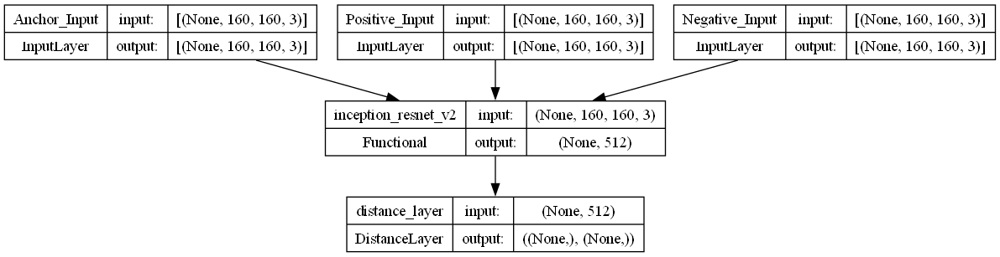

In [26]:
plot_model(siamese_network, show_shapes=True, show_layer_names=True)

In [27]:
class SiameseModel(Model):
    # Builds a Siamese model based on a base-model
    def __init__(self, siamese_network, margin=1.0):
        super(SiameseModel, self).__init__()
        
        self.margin = margin
        self.siamese_network = siamese_network
        self.loss_tracker = metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        # GradientTape get the gradients when we compute loss, and uses them to update the weights
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)
            
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)
        self.optimizer.apply_gradients(zip(gradients, self.siamese_network.trainable_weights))
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)
        
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        # Get the two distances from the network, then compute the triplet loss
        ap_distance, an_distance = self.siamese_network(data)
        loss = tf.maximum(ap_distance - an_distance + self.margin, 0.0)
        return loss

    @property
    def metrics(self):
        # We need to list our metrics so the reset_states() can be called automatically.
        return [self.loss_tracker]

In [28]:
siamese_model = SiameseModel(siamese_network)

optimizer = Adam(learning_rate=1e-3, epsilon=1e-01)
siamese_model.compile(optimizer=optimizer)

In [29]:
def test_on_triplets(batch_size = 256):
    pos_scores, neg_scores = [], []

    for data in get_batch(test_triplet, batch_size=batch_size):
        try:
            prediction = siamese_model.predict(data)
            pos_scores += list(prediction[0])
            neg_scores += list(prediction[1])
        except:
            continue
    
    accuracy = np.sum(np.array(pos_scores) < np.array(neg_scores)) / len(pos_scores)
    ap_mean = np.mean(pos_scores)
    an_mean = np.mean(neg_scores)
    ap_stds = np.std(pos_scores)
    an_stds = np.std(neg_scores)
    
    print(f"Accuracy on test = {accuracy:.5f}")
    return (accuracy, ap_mean, an_mean, ap_stds, an_stds)

In [30]:
save_all = False
epochs = 35
batch_size = 256

max_acc = 0
train_loss = []
test_metrics = []

for epoch in range(1, epochs+1):
    t = time.time()
    
    # Training the model on train data
    epoch_loss = []
    for data in get_batch(train_triplet, batch_size=batch_size):
        loss = siamese_model.train_on_batch(data)
        epoch_loss.append(loss)
    epoch_loss = sum(epoch_loss)/len(epoch_loss)
    train_loss.append(epoch_loss)

    print(f"\nEPOCH: {epoch} \t (Epoch done in {int(time.time()-t)} sec)")
    print(f"Loss on train    = {epoch_loss}")
    
    # Testing the model on test data
    metric = test_on_triplets(batch_size=batch_size)
    test_metrics.append(metric)
    accuracy = metric[0]
    
    # Saving the model weights
    if save_all or accuracy>=max_acc:
        siamese_model.save_weights(filepath = "current/siamese_model_9", save_format='h5')
        max_acc = accuracy

# Saving the model after all epochs run
siamese_model.save_weights(filepath = "final/siamese_model-final_9", save_format='h5')

Yielding batch with 256 triplets, skipped 67
Yielding batch with 256 triplets, skipped 51
Yielding batch with 256 triplets, skipped 46
Yielding batch with 256 triplets, skipped 57
Yielding batch with 256 triplets, skipped 68
Yielding batch with 256 triplets, skipped 55
Yielding batch with 256 triplets, skipped 46
Yielding batch with 256 triplets, skipped 43
Yielding batch with 256 triplets, skipped 67
Yielding batch with 256 triplets, skipped 53
Yielding batch with 256 triplets, skipped 62
Yielding batch with 256 triplets, skipped 55
Yielding batch with 256 triplets, skipped 50
Yielding batch with 256 triplets, skipped 58
Yielding batch with 256 triplets, skipped 56
Yielding batch with 256 triplets, skipped 40
Yielding batch with 159 triplets, skipped 28

EPOCH: 1 	 (Epoch done in 1386 sec)
Loss on train    = 0.13720395503675237
Yielding batch with 256 triplets, skipped 64
8/8 [==============================] - 47s 4s/step
Yielding batch with 256 triplets, skipped 74
8/8 [=============

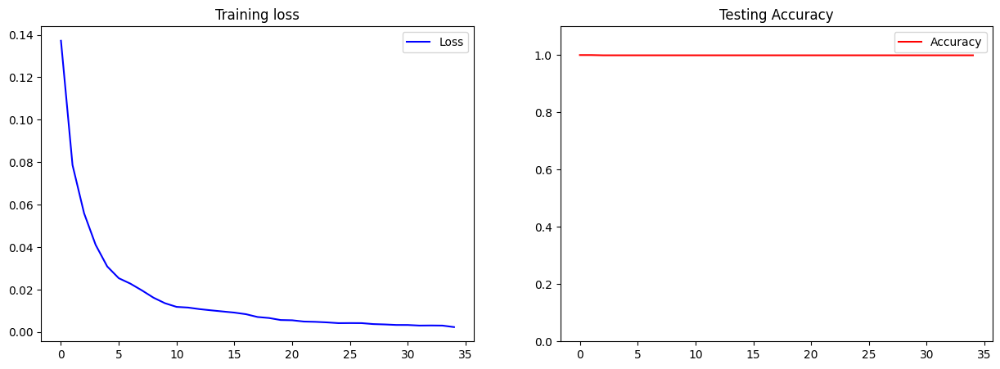

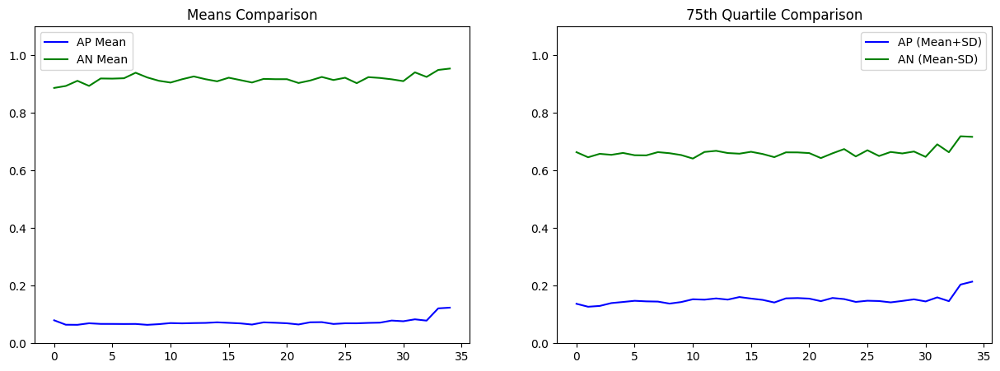

In [31]:
def plot_metrics(loss, metrics):
    # Extracting individual metrics from metrics
    accuracy = metrics[:, 0]
    ap_mean  = metrics[:, 1]
    an_mean  = metrics[:, 2]
    ap_stds  = metrics[:, 3]
    an_stds  = metrics[:, 4]
    
    plt.figure(figsize=(15,5))
    
    # Plotting the loss over epochs
    plt.subplot(121)
    plt.plot(loss, 'b', label='Loss')
    plt.title('Training loss')
    plt.legend()
    
    # Plotting the accuracy over epochs
    plt.subplot(122)
    plt.plot(accuracy, 'r', label='Accuracy')
    plt.title('Testing Accuracy')
    plt.ylim(0, 1.1)
    plt.legend()
    
    plt.figure(figsize=(15,5))
    
    # Comparing the Means over epochs
    plt.subplot(121)
    plt.plot(ap_mean, 'b', label='AP Mean')
    plt.plot(an_mean, 'g', label='AN Mean')
    plt.title('Means Comparison')
    plt.ylim(0, 1.1)
    plt.legend()
    
    # Plotting the accuracy
    ap_75quartile = (ap_mean+ap_stds)
    an_75quartile = (an_mean-an_stds)
    plt.subplot(122)
    plt.plot(ap_75quartile, 'b', label='AP (Mean+SD)')
    plt.plot(an_75quartile, 'g', label='AN (Mean-SD)')
    plt.title('75th Quartile Comparison')
    plt.ylim(0, 1.1)
    plt.legend()

test_metrics = np.array(test_metrics)
plot_metrics(train_loss, test_metrics)

In [32]:
# class FaceRecognitionSystem:
#     def __init__(self, encoder_model, threshold=0.3):
#         """
#         Initialize face recognition system with a trained encoder
        
#         Args:
#             encoder_model: Trained embedding encoder model
#             threshold: Similarity threshold for face matching
#         """
#         self.encoder = encoder_model
#         self.threshold = threshold
#         self.known_face_embeddings = {}  # Will store {person_id: embedding_array}
        
#     def register_known_faces(self, directory, main_class_list, max_files=5):
#         """
#         Register only the main classes as known identities
        
#         Args:
#             directory: Root directory containing face images
#             main_class_list: Dictionary of {folder_name: num_files} to register
#             max_files: Maximum number of files per person to average for their embedding
#         """
#         for person_id in main_class_list.keys():
#             # Get all files for this person
#             path = os.path.join(directory, person_id)
#             files = list(os.listdir(path))[:max_files]
            
#             # Read and preprocess images
#             face_batch = []
#             for file in files:
#                 img_path = os.path.join(path, file)
#                 img = read_image((person_id, file))
#                 face_batch.append(img)
            
#             face_batch = np.array(face_batch)
#             face_batch = preprocess_input(face_batch)
            
#             # Get embeddings and average them
#             embeddings = self.encoder.predict(face_batch)
#             avg_embedding = np.mean(embeddings, axis=0)
            
#             # Store normalized embedding
#             self.known_face_embeddings[person_id] = avg_embedding / np.linalg.norm(avg_embedding)
    
#     def identify_face(self, face_img):
#         """
#         Identify a face by comparing to registered main classes
        
#         Args:
#             face_img: Face image array (160x160x3)
            
#         Returns:
#             best_match: ID of the best matching person
#             similarity: Similarity score (higher is better)
#             is_match: Boolean indicating if the match is above threshold
#         """
#         # Preprocess and get embedding
#         face_img = np.expand_dims(face_img, axis=0)
#         face_img = preprocess_input(face_img)
#         embedding = self.encoder.predict(face_img)[0]
#         normalized_embedding = embedding / np.linalg.norm(embedding)
        
#         best_match = None
#         best_similarity = -1
        
#         # Compare with all known faces (only main classes)
#         for person_id, known_embedding in self.known_face_embeddings.items():
#             # Calculate cosine similarity (1 - distance)
#             similarity = np.dot(normalized_embedding, known_embedding)
            
#             if similarity > best_similarity:
#                 best_similarity = similarity
#                 best_match = person_id
        
#         is_match = best_similarity > (1 - self.threshold)
#         return best_match, best_similarity, is_match

In [33]:
def extract_encoder(model):
    encoder = get_encoder((160, 160, 3))
    i=0
    for e_layer in model.layers[0].layers[3].layers:
        layer_weight = e_layer.get_weights()
        encoder.layers[i].set_weights(layer_weight)
        i+=1
    return encoder

encoder = extract_encoder(siamese_model)
encoder.save_weights(filepath = "encoder/encoder_9", save_format='h5')
encoder.summary()

# face_system = FaceRecognitionSystem(encoder, threshold=0.3)

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 160, 160, 3)]        0         []                            
                                                                                                  
 Conv2d_1a_3x3 (Conv2D)      (None, 79, 79, 32)           864       ['input_2[0][0]']             
                                                                                                  
 Conv2d_1a_3x3_BatchNorm (B  (None, 79, 79, 32)           96        ['Conv2d_1a_3x3[0][0]']       
 atchNormalization)                                                                               
                                                                                                  
 Conv2d_1a_3x3_Activation (  (None, 79, 79, 32)           0         ['Conv2d_1a_

In [34]:
def cosine_distance(embeddings1, embeddings2):
    dot = np.sum(np.multiply(embeddings1, embeddings2), axis=1)
    norm = np.linalg.norm(embeddings1, axis=1) * np.linalg.norm(embeddings2, axis=1)
    similarity = dot / norm
    dist = np.arccos(similarity) / math.pi
    return dist

def classify_images(face_list1, face_list2, threshold=0.234):
    # Getting the encodings for the passed faces
    tensor1 = encoder.predict(face_list1)
    tensor2 = encoder.predict(face_list2)
    
    distance = cosine_distance(tensor1, tensor2)
    prediction = np.where(distance<=threshold, 0, 1)
    return prediction

In [35]:
def display_misclassified_triplets(num_samples=6, threshold=0.3):
    """
    Displays triplets where the model made incorrect predictions.
    Shows two types of errors:
    1. False Negatives: Model predicted same person's faces as different
    2. False Positives: Model predicted different people's faces as same
    
    Args:
        num_samples: Number of misclassified samples to display for each error type
        threshold: Threshold for classification decision
    """
    false_neg_samples = []  # Anchor-Positive pairs classified as different
    false_pos_samples = []  # Anchor-Negative pairs classified as same
    
    # Get a batch of test triplets
    for data in get_batch(test_triplet, batch_size=64, preprocess=False):
        a, p, n = data
        
        # Get preprocessed version for prediction
        a_preprocessed = preprocess_input(np.copy(a))
        p_preprocessed = preprocess_input(np.copy(p))
        n_preprocessed = preprocess_input(np.copy(n))
        
        # Get embeddings
        a_embeddings = encoder.predict(a_preprocessed)
        p_embeddings = encoder.predict(p_preprocessed)
        n_embeddings = encoder.predict(n_preprocessed)
        
        # Calculate distances
        ap_distances = cosine_distance(a_embeddings, p_embeddings)
        an_distances = cosine_distance(a_embeddings, n_embeddings)
        
        # Find misclassifications
        for i in range(len(a)):
            # False negative: Same person classified as different (ap_distance > threshold)
            if ap_distances[i] > threshold:
                false_neg_samples.append((a[i], p[i], ap_distances[i]))
                if len(false_neg_samples) >= num_samples:
                    break
                    
        for i in range(len(a)):
            # False positive: Different person classified as same (an_distance <= threshold)
            if an_distances[i] <= threshold:
                false_pos_samples.append((a[i], n[i], an_distances[i]))
                if len(false_pos_samples) >= num_samples:
                    break
                
        if len(false_neg_samples) >= num_samples and len(false_pos_samples) >= num_samples:
            break
    
    # Display false negatives (same person classified as different)
    if false_neg_samples:
        plt.figure(figsize=(15, num_samples * 3))
        plt.suptitle(f"FALSE NEGATIVES: Same Person Classified as Different (threshold={threshold})", 
                     fontsize=16, y=0.98)
        
        for i, (anchor, positive, distance) in enumerate(false_neg_samples[:num_samples]):
            plt.subplot(num_samples, 2, 2*i + 1)
            plt.imshow(anchor)
            plt.title(f"Anchor")
            plt.axis('off')
            
            plt.subplot(num_samples, 2, 2*i + 2)
            plt.imshow(positive)
            plt.title(f"Positive (Distance: {distance:.4f})")
            plt.axis('off')
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.95)
    else:
        print("No false negatives found in the sample batch")
    
    # Display false positives (different person classified as same)
    if false_pos_samples:
        plt.figure(figsize=(15, num_samples * 3))
        plt.suptitle(f"FALSE POSITIVES: Different People Classified as Same (threshold={threshold})", 
                     fontsize=16, y=0.98)
        
        for i, (anchor, negative, distance) in enumerate(false_pos_samples[:num_samples]):
            plt.subplot(num_samples, 2, 2*i + 1)
            plt.imshow(anchor)
            plt.title(f"Anchor")
            plt.axis('off')
            
            plt.subplot(num_samples, 2, 2*i + 2)
            plt.imshow(negative)
            plt.title(f"Negative (Distance: {distance:.4f})")
            plt.axis('off')
        
        plt.tight_layout()
        plt.subplots_adjust(top=0.95)
    else:
        print("No false positives found in the sample batch")
    
    return

# Example usage:
# display_misclassified_triplets(num_samples=5, threshold=0.3)

In [36]:
def display_true_positives(num_samples=6, threshold=0.3, margin=0.05):
    """
    Displays True Positive pairs where the model correctly classified the same person's faces as similar,
    but with distances close to the threshold (i.e. 'hard' positives).

    Args:
        num_samples: Number of true positives to display
        threshold: Threshold for classification decision
        margin: Range near the threshold to select 'hard' positives (e.g. within threshold ± margin)
    """
    hard_tp_samples = []

    # Get a batch of test triplets
    for data in get_batch(test_triplet, batch_size=64, preprocess=False):
        a, p, _ = data

        # Preprocess inputs for prediction
        a_preprocessed = preprocess_input(np.copy(a))
        p_preprocessed = preprocess_input(np.copy(p))

        # Get embeddings
        a_embeddings = encoder.predict(a_preprocessed)
        p_embeddings = encoder.predict(p_preprocessed)

        # Calculate distances
        ap_distances = cosine_distance(a_embeddings, p_embeddings)

        # Find hard true positives: distance <= threshold but close to it
        for i in range(len(a)):
            if ap_distances[i] <= threshold and ap_distances[i] >= (threshold - margin):
                hard_tp_samples.append((a[i], p[i], ap_distances[i]))
                if len(hard_tp_samples) >= num_samples:
                    break

        if len(hard_tp_samples) >= num_samples:
            break

    # Display hard true positives
    if hard_tp_samples:
        plt.figure(figsize=(15, num_samples * 3))
        plt.suptitle(
            f"HARD TRUE POSITIVES: Correctly Classified as Same Person "
            f"(threshold={threshold}, margin={margin})",
            fontsize=16, y=0.98
        )

        for i, (anchor, positive, distance) in enumerate(hard_tp_samples[:num_samples]):
            plt.subplot(num_samples, 2, 2 * i + 1)
            plt.imshow(anchor)
            plt.title("Anchor")
            plt.axis('off')

            plt.subplot(num_samples, 2, 2 * i + 2)
            plt.imshow(positive)
            plt.title(f"Positive (Distance: {distance:.4f})")
            plt.axis('off')

        plt.tight_layout()
        plt.subplots_adjust(top=0.95)
    else:
        print("No hard true positives found in the sample batch")

    return

# Example usage:
# display_true_positives(num_samples=5, threshold=0.3, margin=0.05)

In [37]:
threshold = 0.234

In [38]:
# face_system.register_known_faces(DATASET_DIR, train_main)
# person_id, similarity, is_match = face_system.identify_face(test_face)

In [39]:
# print(f"Person ID: {person_id}")
# print(type(person_id))

# print(f"Similarity: {similarity}")
# print(type(similarity))

# print(f"Is match: {is_match}")
# print(type(is_match))

In [40]:
MAIN_THRESHOLD = 0.2552855908870697

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import interpolate
from sklearn.metrics import roc_curve, auc
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.applications import InceptionResNetV2
import tensorflow as tf
import os

In [42]:
def calculate_metrics(y_true, distances, far_values=[0.01, 0.001, 0.0001]):
    """
    Calculate TAR@FAR and EER for face recognition system.
    
    Args:
        y_true: Ground truth labels (0 for same identity, 1 for different identity)
        distances: Similarity distances (lower value means more similar)
        far_values: List of FAR values at which to calculate TAR
        
    Returns:
        Dictionary containing EER and TAR values at specified FAR thresholds
    """
    # Debug: Check score distribution
    same_identity_scores = distances[y_true == 1]  # Same identity (AP, low distances)
    diff_identity_scores = distances[y_true == 0]  # Different identity (AN, high distances)
    print("Same Identity Distances: Mean =", np.mean(same_identity_scores), "Std =", np.std(same_identity_scores))
    print("Diff Identity Distances: Mean =", np.mean(diff_identity_scores), "Std =", np.std(diff_identity_scores))
    
    # y_scores: higher scores for same identity (y_true = 1), so negate distances
    y_scores = -distances
    fpr, tpr, thresholds = roc_curve(y_true, y_scores)
    
    # Debug: Check ROC curve points
    print("First 5 FPR:", fpr[1:6])
    print("First 5 TPR:", tpr[1:6])
    print("First 5 Thresholds:", thresholds[1:6])
    
    roc_auc = auc(fpr, tpr)
    frr = 1 - tpr
    eer_index = np.nanargmin(np.absolute(fpr - frr))
    eer = (fpr[eer_index] + frr[eer_index]) / 2
    
    tar_at_far = {}
    for far_value in far_values:
        if np.max(fpr) >= far_value:
            idx = np.searchsorted(fpr, far_value, side='right') - 1
            tar_at_far[str(far_value)] = tpr[idx]
            threshold = -thresholds[idx]
            print(f"TAR@FAR{far_value}={threshold}")
        else:
            tar_at_far[str(far_value)] = None
    
    metrics = {
        'EER': eer,
        'AUC': roc_auc,
        'TAR@FAR': tar_at_far
    }
    return metrics, fpr, tpr, thresholds

In [43]:
def plot_roc_curve(fpr, tpr, roc_auc, eer, tar_at_far):
    """Plot ROC curve with EER and TAR@FAR markers"""
    plt.figure(figsize=(10, 8))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    
    # Mark EER point
    eer_x = np.interp(eer, fpr, tpr)
    plt.plot([eer, eer], [0, 1], 'r--', alpha=0.3)
    plt.plot([0, 1], [1-eer, 1-eer], 'r--', alpha=0.3)
    plt.scatter(eer, 1-eer, color='red', label=f'EER = {eer:.4f}')
    
    # Mark TAR@FAR points
    for far_value, tar_value in tar_at_far.items():
        if tar_value is not None:
            plt.scatter(float(far_value), tar_value, marker='o', 
                       label=f'TAR@FAR{far_value} = {tar_value:.4f}')
            
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Accept Rate (FAR)')
    plt.ylabel('True Accept Rate (TAR)')
    plt.title('Receiver Operating Characteristic')
    plt.legend(loc="lower right")
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.savefig("ROC.png")
    
    # Zoom in to the high-accuracy region
    plt.figure(figsize=(10, 8))
    plt.plot(fpr, tpr, color='blue', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

    plt.plot([eer, eer], [0, 1], 'r--', alpha=0.3)
    plt.plot([0, 1], [1-eer, 1-eer], 'r--', alpha=0.3)
    plt.scatter(eer, 1-eer, color='red', label=f'EER = {eer:.4f}')

    for far_value, tar_value in tar_at_far.items():
        if tar_value is not None:
            plt.scatter(float(far_value), tar_value, marker='o', 
                       label=f'TAR@FAR{far_value} = {tar_value:.4f}')
    
    plt.xlim([0.0, 0.2])
    plt.ylim([0.8, 1.0])
    plt.xlabel('False Accept Rate (FAR)')
    plt.ylabel('True Accept Rate (TAR)')
    plt.title('ROC Curve (Zoomed to high-accuracy region)')
    plt.grid(True, alpha=0.3)
    plt.legend(loc="lower right")
    plt.tight_layout()
    plt.savefig("ROC_zoomed.png")
    plt.show()

In [44]:
def evaluate_face_recognition_system(encoder, test_triplets, batch_size=256, preprocess_func=None, far_values=[0.01, 0.001, 0.0001]):
    """
    Evaluates face recognition system using triplets data.
    
    Args:
        encoder: Face embedding model that outputs embeddings
        test_triplets: List of triplets (anchor, positive, negative)
        batch_size: Size of batches to process at once
        preprocess_func: Function to preprocess images (if any)
        far_values: FAR values at which to calculate TAR
        
    Returns:
        Dictionary of metrics and plots ROC curve
    """
    global MAIN_THRESHOLD
    all_ap_distances = []
    all_an_distances = []
    for data in get_batch(test_triplets, batch_size=batch_size, preprocess=False):
        a, p, n = data
        a_preprocessed = preprocess_func(np.copy(a))
        p_preprocessed = preprocess_func(np.copy(p))
        n_preprocessed = preprocess_func(np.copy(n))
        a_embeddings = encoder.predict(a_preprocessed)
        p_embeddings = encoder.predict(p_preprocessed)
        n_embeddings = encoder.predict(n_preprocessed)
        ap_distances = cosine_distance(a_embeddings, p_embeddings)
        an_distances = cosine_distance(a_embeddings, n_embeddings)
        for i in range(len(a)):
            all_ap_distances.append((a[i], p[i], ap_distances[i]))
            all_an_distances.append((a[i], n[i], an_distances[i]))
    
    ap_dists = np.array([d[2] for d in all_ap_distances])
    an_dists = np.array([d[2] for d in all_an_distances])
    
    print("AP Distance Stats: Mean =", np.mean(ap_dists), "Std =", np.std(ap_dists))
    print("AN Distance Stats: Mean =", np.mean(an_dists), "Std =", np.std(an_dists))
    print("Number of AP pairs:", len(ap_dists))
    print("Number of AN pairs:", len(an_dists))

    # Generate histogram of AP and AN distances
    plt.figure(figsize=(10, 6))
    plt.hist(ap_dists, bins=50, alpha=0.5, label='AP Distances (Same Identity)', color='blue')
    plt.hist(an_dists, bins=50, alpha=0.5, label='AN Distances (Different Identity)', color='red')
    plt.title('Embedding Distance Distribution')
    plt.xlabel('Cosine Distance')
    plt.ylabel('Frequency')
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.savefig('distance_distribution.png')
    plt.show()
    
    # y_true: 1 for same identity (AP), 0 for different identity (AN)
    y_true = np.array([1] * len(ap_dists) + [0] * len(an_dists))
    distances = np.concatenate([ap_dists, an_dists])
    
    print("First 5 AP distances:", ap_dists[:5])
    print("First 5 AN distances:", an_dists[:5])
    print("y_true around transition (last 5 AP, first 5 AN):", y_true[len(ap_dists)-5:len(ap_dists)+5])
    print("distances around transition (last 5 AP, first 5 AN):", distances[len(ap_dists)-5:len(ap_dists)+5])
    
    metrics, fpr, tpr, thresholds = calculate_metrics(y_true, distances, far_values)
    
    # Print EER threshold in original distance scale
    eer_threshold_idx = np.argmin(np.abs(fpr - (1 - tpr)))
    optimal_threshold = -thresholds[eer_threshold_idx]  # Undo negation
    MAIN_THRESHOLD = optimal_threshold
    print(f"Threshold at EER: {optimal_threshold:.6f}")
    
    plot_roc_curve(fpr, tpr, metrics['AUC'], metrics['EER'], metrics['TAR@FAR'])
    
    print("Face Recognition System Evaluation Metrics:")
    print(f"EER: {metrics['EER']:.6f}")
    print(f"AUC: {metrics['AUC']:.6f}")
    print("\nTAR@FAR values:")
    for far_value, tar_value in metrics['TAR@FAR'].items():
        if tar_value is not None:
            print(f"TAR@FAR={far_value}: {tar_value:.6f}")
    
    return metrics

In [45]:
# test_encoder = get_encoder(input_shape=(160, 160, 3))
# test_weights_path = "encoder/encoder.h5"
# if not os.path.exists(test_weights_path):
#     raise FileNotFoundError(f"Weight file not found at {test_weights_path}")
# test_encoder.load_weights(test_weights_path)
# print(f"Loaded encoder weights from {test_weights_path}")

Yielding batch with 256 triplets, skipped 79
8/8 [==============================] - 10s 1s/step
Yielding batch with 256 triplets, skipped 84
8/8 [==============================] - 10s 1s/step
Yielding batch with 256 triplets, skipped 67
8/8 [==============================] - 10s 1s/step
Yielding batch with 256 triplets, skipped 63
8/8 [==============================] - 10s 1s/step
Yielding batch with 114 triplets, skipped 33
4/4 [==============================] - 4s 1s/step
AP Distance Stats: Mean = 0.15003644 Std = 0.058378052
AN Distance Stats: Mean = 0.48427674 Std = 0.07836416
Number of AP pairs: 1138
Number of AN pairs: 1138


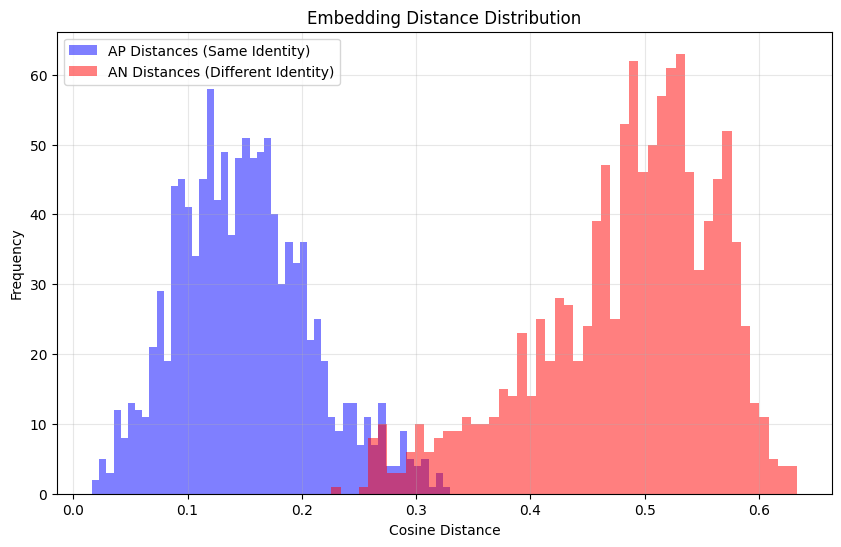

First 5 AP distances: [0.21735905 0.25753    0.20466836 0.14545344 0.2473269 ]
First 5 AN distances: [0.6006982  0.28783026 0.55243015 0.57479024 0.5286401 ]
y_true around transition (last 5 AP, first 5 AN): [1 1 1 1 1 0 0 0 0 0]
distances around transition (last 5 AP, first 5 AN): [0.10831361 0.15647382 0.15369527 0.11600678 0.0510924  0.6006982
 0.28783026 0.55243015 0.57479024 0.5286401 ]
Same Identity Distances: Mean = 0.15003644 Std = 0.058378052
Diff Identity Distances: Mean = 0.48427674 Std = 0.07836416
First 5 FPR: [0.         0.         0.00087873 0.00087873 0.00175747]
First 5 TPR: [8.78734622e-04 9.00702988e-01 9.00702988e-01 9.42003515e-01
 9.42003515e-01]
First 5 Thresholds: [-0.01647943 -0.22506376 -0.22569525 -0.2552856  -0.2555507 ]
TAR@FAR0.1=0.3607710003852844
TAR@FAR0.01=0.2682085633277893
TAR@FAR0.001=0.2552855908870697
TAR@FAR0.0001=0.225063756108284
Threshold at EER: 0.287830


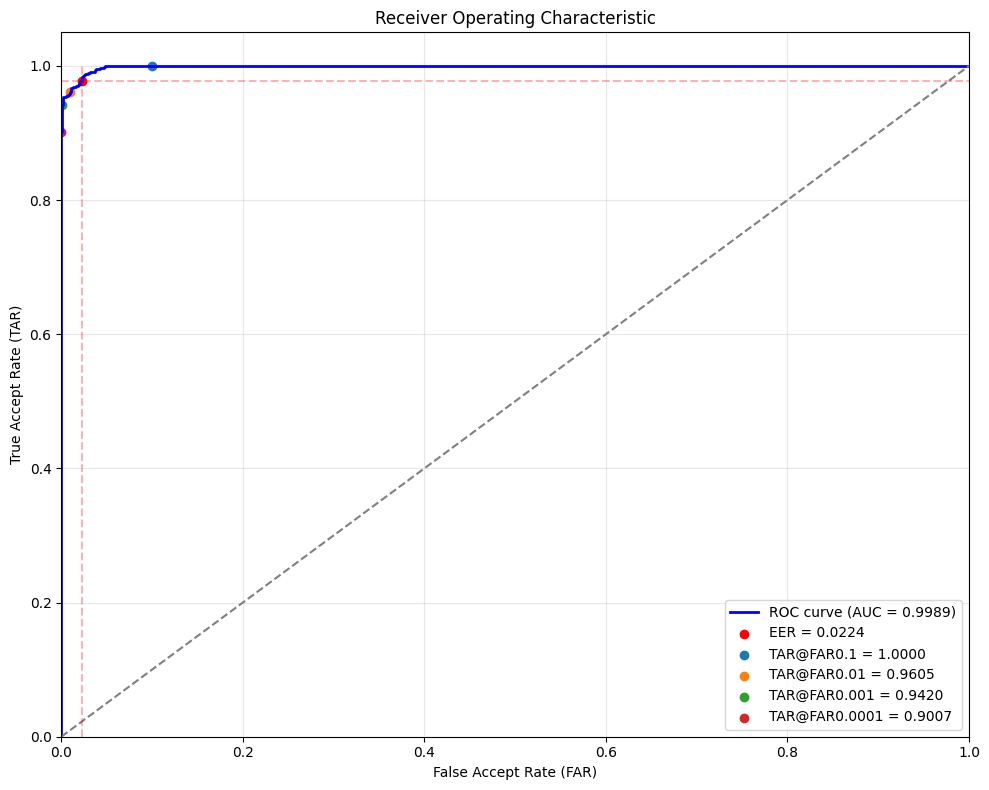

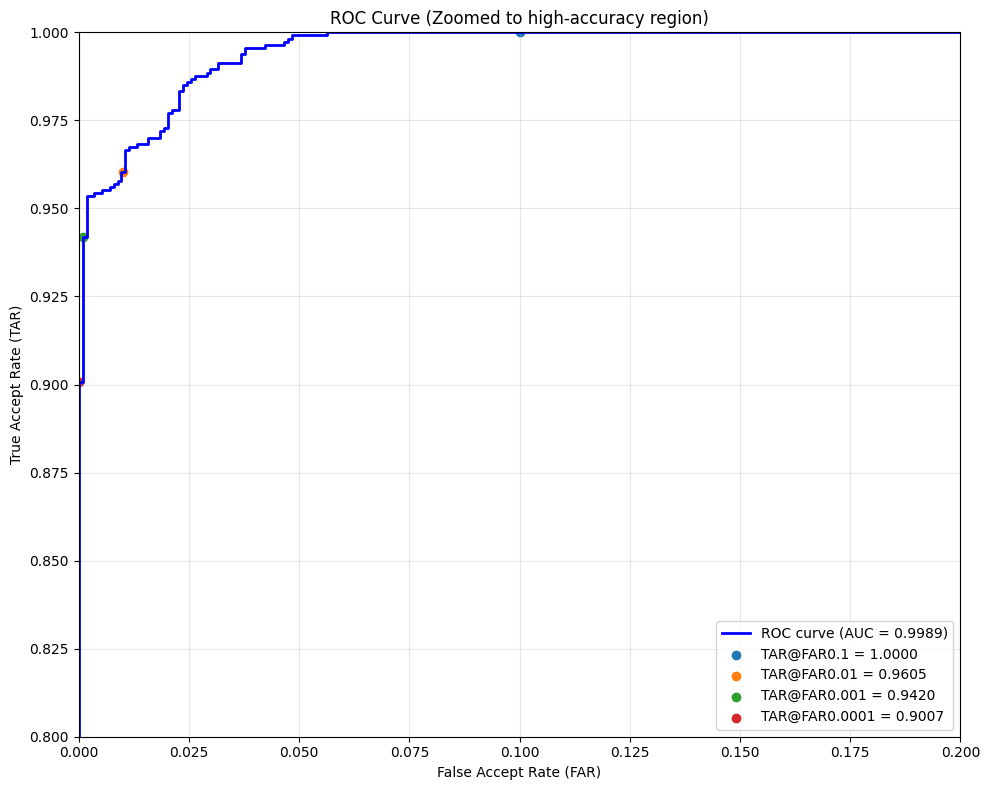

Face Recognition System Evaluation Metrics:
EER: 0.022408
AUC: 0.998907

TAR@FAR values:
TAR@FAR=0.1: 1.000000
TAR@FAR=0.01: 0.960457
TAR@FAR=0.001: 0.942004
TAR@FAR=0.0001: 0.900703


In [46]:
test_metrics = evaluate_face_recognition_system(
    encoder=encoder,
    test_triplets=test_triplet,
    batch_size=256,
    preprocess_func=preprocess_input,
    far_values=[0.1, 0.01, 0.001, 0.0001]
)

In [47]:
print(MAIN_THRESHOLD)

0.28783026


Yielding batch with 256 triplets, skipped 58
8/8 [==============================] - 10s 1s/step
Yielding batch with 256 triplets, skipped 79
8/8 [==============================] - 10s 1s/step
Yielding batch with 256 triplets, skipped 85
8/8 [==============================] - 10s 1s/step
Yielding batch with 256 triplets, skipped 75
8/8 [==============================] - 10s 1s/step
Yielding batch with 114 triplets, skipped 29
4/4 [==============================] - 5s 1s/step

Accuracy of model: 0.9775922671353251



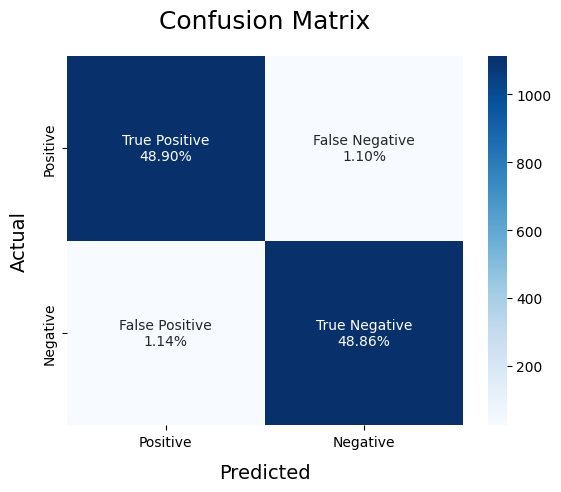

In [48]:
def ModelMetrics(pos_list, neg_list):
    true = np.array([0]*len(pos_list)+[1]*len(neg_list))
    pred = np.append(pos_list, neg_list)
    
    # Compute and print the accuracy
    print(f"\nAccuracy of model: {accuracy_score(true, pred)}\n")
    
    # Compute and plot the Confusion matrix
    cf_matrix = confusion_matrix(true, pred)

    categories  = ['Positive','Negative']
    names = ['True Positive','False Negative', 'False Positive','True Negative']
    percentages = ['{0:.2%}'.format(value) for value in cf_matrix.flatten() / np.sum(cf_matrix)]

    labels = [f'{v1}\n{v2}' for v1, v2 in zip(names, percentages)]
    labels = np.asarray(labels).reshape(2,2)

    sns.heatmap(cf_matrix, annot = labels, cmap = 'Blues',fmt = '',
                xticklabels = categories, yticklabels = categories)

    plt.xlabel("Predicted", fontdict = {'size':14}, labelpad = 10)
    plt.ylabel("Actual"   , fontdict = {'size':14}, labelpad = 10)
    plt.title ("Confusion Matrix", fontdict = {'size':18}, pad = 20)
    plt.savefig("confusion_matrix.png")


pos_list = np.array([])
neg_list = np.array([])

for data in get_batch(test_triplet, batch_size=256):
    a, p, n = data
    pos_list = np.append(pos_list, classify_images(a, p, MAIN_THRESHOLD))
    neg_list = np.append(neg_list, classify_images(a, n, MAIN_THRESHOLD))

ModelMetrics(pos_list, neg_list)

Yielding batch with 64 triplets, skipped 14
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 23
2/2 [==============================] - 3s 1s/step
Yielding batch with 64 triplets, skipped 13
2/2 [==============================] - 3s 1s/step
Yielding batch with 64 triplets, skipped 21
2/2 [==============================] - 3s 1s/step
Yielding batch with 64 triplets, skipped 18
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 23
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 13
2/2 [==============================] - 3s 1s/step
Yielding batch with 64 triplets, skipped 22
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 17
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 19
2/2 [==============================] - 3s 1s/step
Yielding batch with 64 triplets, skipped 17
2/2 [===========

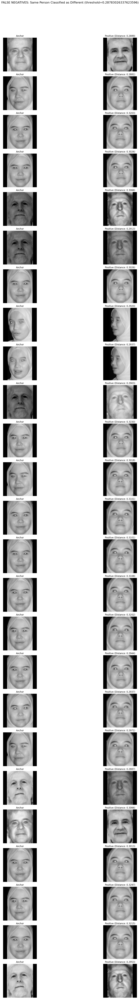

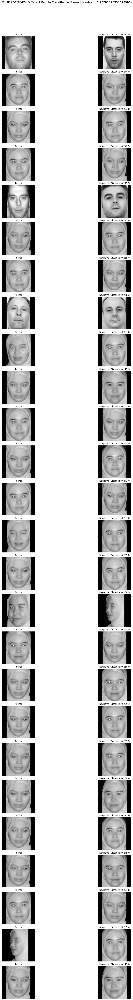

In [52]:
display_misclassified_triplets(num_samples=30, threshold=MAIN_THRESHOLD)

Yielding batch with 64 triplets, skipped 11
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 14
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 19
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 16
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 19
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 21
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 16
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 11
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 26
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 16
2/2 [==============================] - 2s 1s/step
Yielding batch with 64 triplets, skipped 24
2/2 [===========

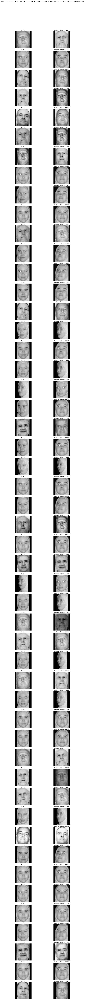

In [51]:
display_true_positives(num_samples=50, threshold=MAIN_THRESHOLD, margin=0.05)